# Image Retrieval Test

Use this notebook to check whether your images are indexed and retrieved correctly.

Your project uses CLIP, so text and images are in the same vector space. That means you can search images using text like `dog`, `cat`, or `Aarav image`.

## Step 1: Load FAISS store

In [1]:
from pathlib import Path
from IPython.display import Image, display

from embeddings import embed_text, embed_image_bytes
from vector_store import FaissStore

store = FaissStore(path="store")
print("Total indexed items:", store.count())

c:\Users\aarav\Desktop\AI-Powered Search Engine\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Total indexed items: 11


## Step 2: List only indexed images

This checks whether `data_loader.py` added your images into `metadata.json`.

In [2]:
all_metadata = store.list_meta()

for item_id, meta in all_metadata.items():
    if meta.get("type") == "image":
        print(item_id)
        print("  title:", meta.get("title"))
        print("  file:", meta.get("filename"))
        print("  caption:", meta.get("caption"))

image:aarav_pic.jpeg
  title: Aarav's Image
  file: aarav_pic.jpeg
  caption: A personal image of Aarav.
image:cat1.png
  title: Cat
  file: cat1.png
  caption: A domestic cat.
image:dog1.png
  title: Dog
  file: dog1.png
  caption: A dog holding a flower in its mouth.
image:dog2.png
  title: Dog
  file: dog2.png
  caption: A dog standing outdoors.
image:dog3.png
  title: Dog
  file: dog3.png
  caption: A domestic dog commonly kept as a pet.


## Step 3: Text-to-image search

Here we type a text query. CLIP converts the text into a vector. FAISS searches for nearby vectors, including image vectors.

In [12]:
def search_and_show_images(query, top_k=2):
    query_vector = embed_text(query)
    hits = store.search(query_vector, top_k=top_k)

    print("Query:", query)
    print("Lower FAISS L2 score means more similar.\n")

    found_image = False

    for index, hit in enumerate(hits, start=1):
        meta = hit["metadata"]
        print(f"Result {index}")
        print("  id:", hit["id"])
        print("  score:", hit["score"])
        print("  title:", meta.get("title"))
        print("  type:", meta.get("type"))
        print("  source:", meta.get("source") or meta.get("filename"))
        print("  caption:", meta.get("caption"))

        if meta.get("type") == "image":
            found_image = True
            image_path = Path("data/images") / meta["filename"]
            display(Image(filename=str(image_path), width=250))

        print()

    if not found_image:
        print("No image found in top results. Try increasing top_k or changing the query.")

    return hits

In [13]:
hits = search_and_show_images("dog", top_k=5)

Query: dog
Lower FAISS L2 score means more similar.

Result 1
  id: text:ml.txt
  score: 50.997802734375
  title: ml
  type: text
  source: ml.txt
  caption: None

Result 2
  id: text:ai.txt
  score: 51.64204788208008
  title: ai
  type: text
  source: ai.txt
  caption: None

Result 3
  id: text:secret_project.txt
  score: 54.94486999511719
  title: secret_project
  type: text
  source: secret_project.txt
  caption: None

Result 4
  id: text:ai_rag_intro.txt
  score: 69.57886505126953
  title: ai_rag_intro
  type: text
  source: ai_rag_intro.txt
  caption: None

Result 5
  id: text:manish._project.txt
  score: 81.35543823242188
  title: manish._project
  type: text
  source: manish._project.txt
  caption: None

No image found in top results. Try increasing top_k or changing the query.


In [5]:
hits = search_and_show_images("cat", top_k=5)

Query: cat
Lower FAISS L2 score means more similar.

Result 1
  id: text:ai.txt
  score: 52.50892639160156
  title: ai
  type: text
  source: ai.txt
  caption: None

Result 2
  id: text:ml.txt
  score: 53.38872528076172
  title: ml
  type: text
  source: ml.txt
  caption: None

Result 3
  id: text:secret_project.txt
  score: 61.630645751953125
  title: secret_project
  type: text
  source: secret_project.txt
  caption: None

Result 4
  id: text:ai_rag_intro.txt
  score: 70.94454956054688
  title: ai_rag_intro
  type: text
  source: ai_rag_intro.txt
  caption: None

Result 5
  id: text:manish._project.txt
  score: 79.26116180419922
  title: manish._project
  type: text
  source: manish._project.txt
  caption: None

No image found in top results. Try increasing top_k or changing the query.


In [6]:
hits = search_and_show_images("Aarav personal image", top_k=5)

Query: Aarav personal image
Lower FAISS L2 score means more similar.

Result 1
  id: text:ai.txt
  score: 52.819725036621094
  title: ai
  type: text
  source: ai.txt
  caption: None

Result 2
  id: text:secret_project.txt
  score: 57.46419143676758
  title: secret_project
  type: text
  source: secret_project.txt
  caption: None

Result 3
  id: text:ml.txt
  score: 58.534664154052734
  title: ml
  type: text
  source: ml.txt
  caption: None

Result 4
  id: text:aarav_project.txt
  score: 61.23273849487305
  title: aarav_project
  type: text
  source: aarav_project.txt
  caption: None

Result 5
  id: text:manish._project.txt
  score: 61.27594757080078
  title: manish._project
  type: text
  source: manish._project.txt
  caption: None

No image found in top results. Try increasing top_k or changing the query.


In [14]:
hits = search_and_show_images("human face", top_k=1)

Query: human face
Lower FAISS L2 score means more similar.

Result 1
  id: text:secret_project.txt
  score: 50.95079040527344
  title: secret_project
  type: text
  source: secret_project.txt
  caption: None

No image found in top results. Try increasing top_k or changing the query.


Query: person photo
Lower FAISS L2 score means more similar.

Result 1
  id: text:secret_project.txt
  score: 50.08696746826172
  title: secret_project
  type: text
  source: secret_project.txt
  caption: None

Result 2
  id: text:ai.txt
  score: 60.55316162109375
  title: ai
  type: text
  source: ai.txt
  caption: None

Result 3
  id: text:ml.txt
  score: 60.979698181152344
  title: ml
  type: text
  source: ml.txt
  caption: None

Result 4
  id: text:ai_rag_intro.txt
  score: 91.49077606201172
  title: ai_rag_intro
  type: text
  source: ai_rag_intro.txt
  caption: None

Result 5
  id: text:manish._project.txt
  score: 102.07843017578125
  title: manish._project
  type: text
  source: manish._project.txt
  caption: None

Result 6
  id: text:aarav_project.txt
  score: 104.89817810058594
  title: aarav_project
  type: text
  source: aarav_project.txt
  caption: None

Result 7
  id: image:aarav_pic.jpeg
  score: 208.25086975097656
  title: Aarav's Image
  type: image
  source: aarav_pi

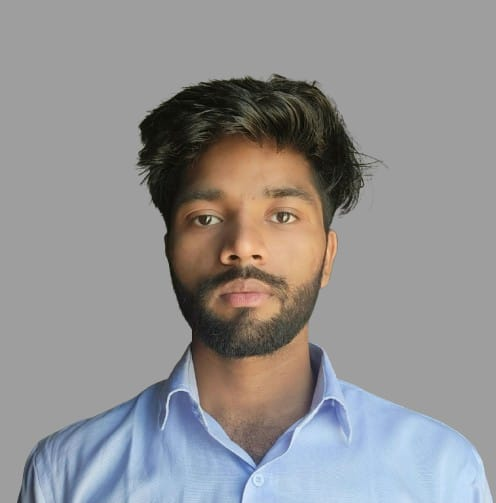


Result 8
  id: image:cat1.png
  score: 221.28863525390625
  title: Cat
  type: image
  source: cat1.png
  caption: A domestic cat.


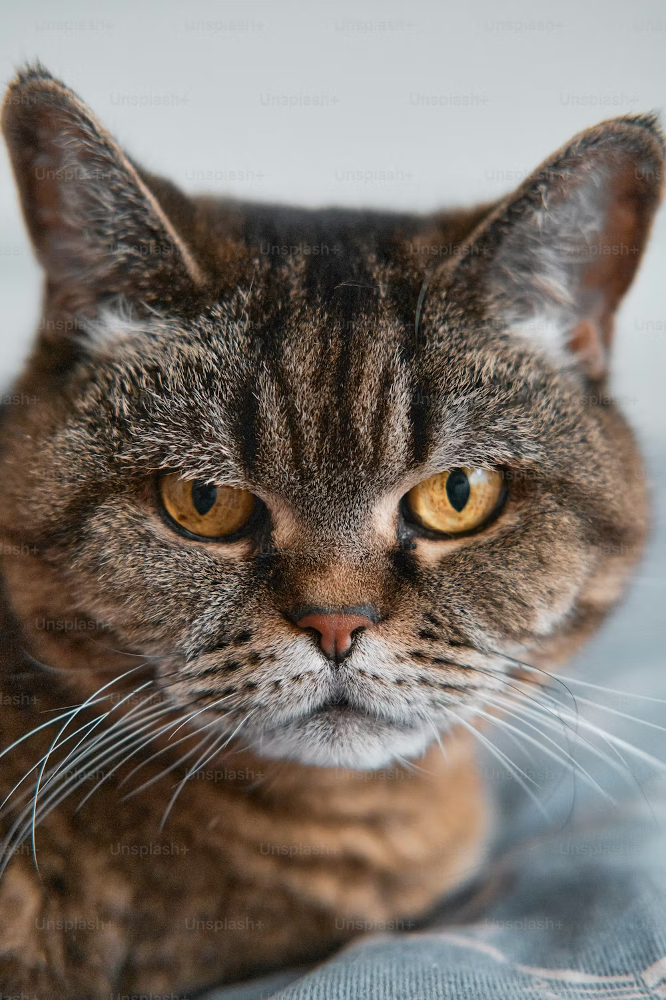


Result 9
  id: image:dog1.png
  score: 221.70860290527344
  title: Dog
  type: image
  source: dog1.png
  caption: A dog holding a flower in its mouth.


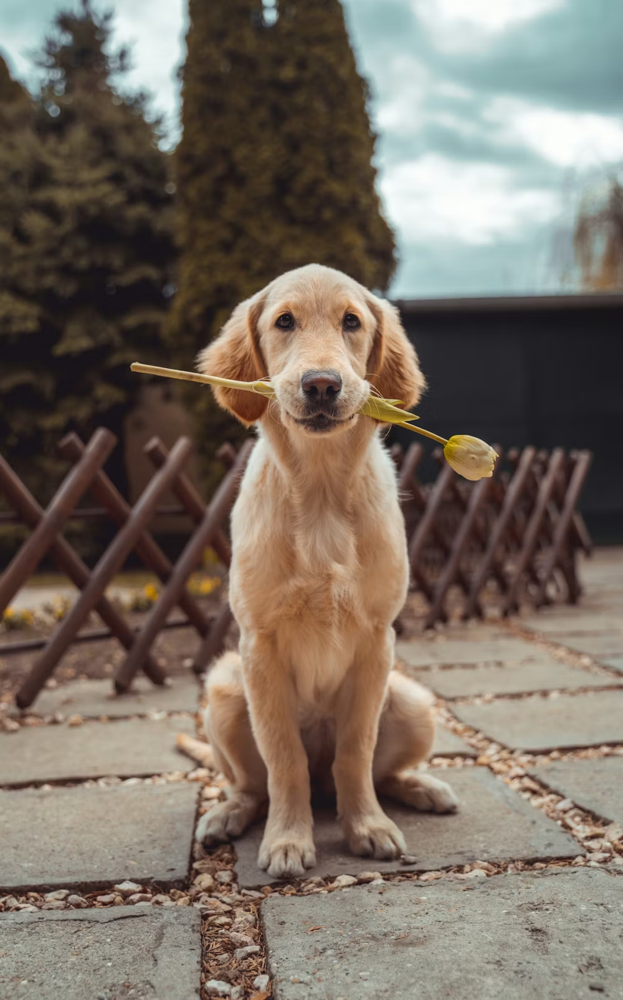


Result 10
  id: image:dog3.png
  score: 231.20855712890625
  title: Dog
  type: image
  source: dog3.png
  caption: A domestic dog commonly kept as a pet.


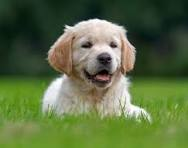


Result 11
  id: image:dog2.png
  score: 236.85433959960938
  title: Dog
  type: image
  source: dog2.png
  caption: A dog standing outdoors.


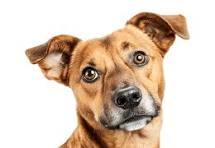

In [7]:
hits = search_and_show_images("person photo", top_k=11)

## Step 4: Image-to-image search

Here we use an image itself as the query. CLIP converts the query image into a vector, and FAISS retrieves similar items.

Important: FAISS always returns the nearest results from the available store. If the store is small, it may still return weak matches after the good matches. That does not mean those images are truly similar; it only means they are the closest among the available indexed items.

In [9]:
def image_to_image_search(image_filename, top_k=5, image_only=True, skip_same_image=True):
    image_path = Path("data/images") / image_filename

    if not image_path.exists():
        raise FileNotFoundError(f"Image not found: {image_path}")

    print("Query image:", image_filename)
    display(Image(filename=str(image_path), width=250))

    query_vector = embed_image_bytes(image_path.read_bytes())

    # Search more items first, then filter. This helps because the store contains both text and images.
    raw_hits = store.search(query_vector, top_k=store.count())
    hits = []

    for hit in raw_hits:
        meta = hit["metadata"]

        if image_only and meta.get("type") != "image":
            continue

        if skip_same_image and meta.get("filename") == image_filename:
            continue

        hits.append(hit)

        if len(hits) == top_k:
            break

    print("\nRetrieved results:\n")

    for index, hit in enumerate(hits, start=1):
        meta = hit["metadata"]
        print(f"Result {index}")
        print("  id:", hit["id"])
        print("  score:", hit["score"])
        print("  title:", meta.get("title"))
        print("  type:", meta.get("type"))
        print("  source:", meta.get("source") or meta.get("filename"))
        print("  caption:", meta.get("caption"))

        if meta.get("type") == "image":
            result_path = Path("data/images") / meta["filename"]
            display(Image(filename=str(result_path), width=220))

        print()

    return hits

Query image: dog1.png


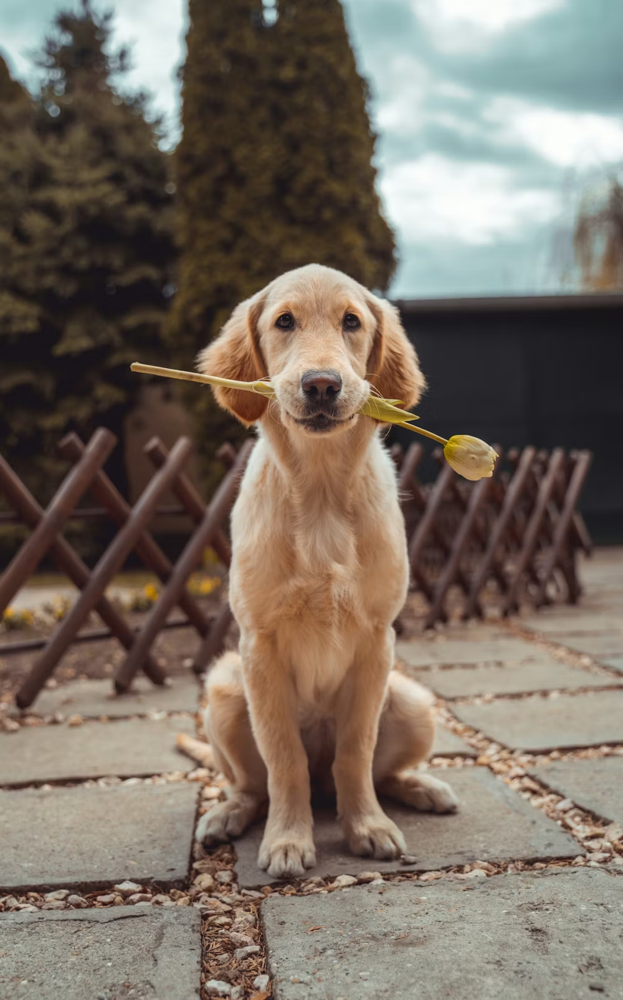


Retrieved results:

Result 1
  id: image:dog1.png
  score: 0.0
  title: Dog
  type: image
  source: dog1.png
  caption: A dog holding a flower in its mouth.


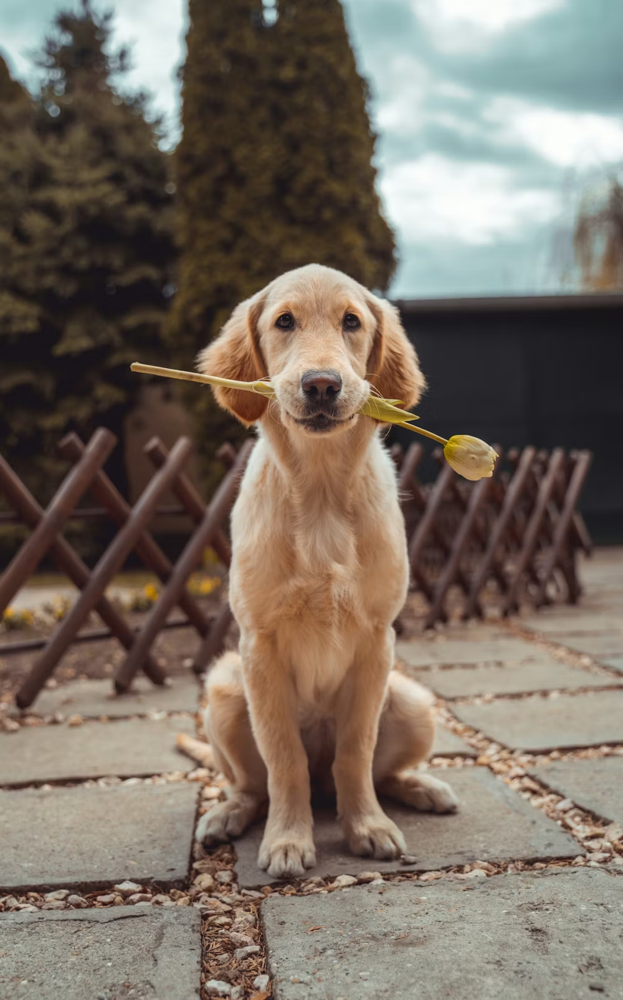


Result 2
  id: image:dog3.png
  score: 62.95134353637695
  title: Dog
  type: image
  source: dog3.png
  caption: A domestic dog commonly kept as a pet.


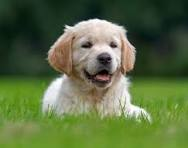

In [11]:
image_hits = image_to_image_search("dog1.png", top_k=2)

## Interview Explanation

Say this:

> I tested image retrieval by embedding a text query like `dog` using CLIP, then searching FAISS. Since CLIP maps text and images into the same vector space, the text query can retrieve image vectors. I also tested image-to-image retrieval by embedding an image and searching for similar vectors.

In [15]:
hits = search_and_show_images("Aarav personal image", top_k=1)

Query: Aarav personal image
Lower FAISS L2 score means more similar.

Result 1
  id: text:ai.txt
  score: 52.819725036621094
  title: ai
  type: text
  source: ai.txt
  caption: None

No image found in top results. Try increasing top_k or changing the query.
